# Importing libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from pprint import pprint
from external_modules.shuyu import *
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import scale
from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from statsmodels.formula.api import ols
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn.linear_model import LassoCV, LassoLarsCV, LassoLarsIC
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet
import seaborn as sns
from sklearn.linear_model import Ridge
import plotly.figure_factory as ff
from itertools import combinations
from sklearn.model_selection import cross_validate


%matplotlib inline

In [3]:
warnings.filterwarnings('ignore')

In [4]:
ls

Data/              README.md          marc_index.ipynb
Pictures/          external_modules/  shuyu_index.ipynb


# Retrieve data into pandas dataframe

## Load csv file

In [5]:
df1 = pd.read_csv("Data/analytic_data2019.csv")

In [6]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3195 entries, 0 to 3194
Columns: 534 entries, State FIPS Code to Population growth raw value
dtypes: object(534)
memory usage: 13.0+ MB


In [7]:
display_all(df1.head().T)

,0,1,2,3,4
State FIPS Code,statecode,00,01,01,01
County FIPS Code,countycode,000,000,001,003
5-digit FIPS Code,fipscode,00000,01000,01001,01003
State Abbreviation,state,US,AL,AL,AL
Name,county,United States,Alabama,Autauga County,Baldwin County
Release Year,year,2019,2019,2019,2019
County Ranked (Yes=1/No=0),county_ranked,NaN,NaN,1,1
Premature death raw value,v001_rawvalue,6900.630354,9917.2328984,8824.0571232,7224.6321603
Premature death numerator,v001_numerator,3745538,80440,815,2827
Premature death denominator,v001_denominator,908266078,13636816,156132,576496


In [8]:
len(df1.columns)

534

## Load excel file

In [9]:
df2 = pd.ExcelFile("Data/2019 County Health Rankings Data - v2.xls")

In [10]:
df_addtional1 =pd.read_excel(df2, 'Additional Measure Data', skiprows=1)

In [11]:
df_addtional1

,FIPS,State,County,Life Expectancy,95% CI - Low,95% CI - High,Life Expectancy (Black),Life Expectancy (Hispanic),Life Expectancy (White),# Deaths,...,% Hispanic,# Non-Hispanic White,% Non-Hispanic White,# Not Proficient in English,% Not Proficient in English,95% CI - Low.16,95% CI - High.16,% Female,# Rural,% Rural
0,1001,Alabama,Autauga,76.330589,75.554117,77.107061,74.600628,NaN,76.337219,815.0,...,2.857452,41336,74.473912,430,0.828548,0.422472,1.234624,51.342246,22921.0,42.002162
1,1003,Alabama,Baldwin,78.599498,78.208357,78.990639,75.628919,98.039893,78.537003,2827.0,...,4.550200,176582,83.047388,872,0.454512,0.282144,0.626880,51.452772,77060.0,42.279099
2,1005,Alabama,Barbour,75.779457,74.639355,76.919559,74.240228,NaN,77.568384,451.0,...,4.206569,11613,45.955679,297,1.199273,0.580536,1.818011,47.229917,18613.0,67.789635
3,1007,Alabama,Bibb,73.928271,72.624611,75.231931,72.294686,NaN,74.109510,445.0,...,2.638080,16842,74.298571,84,0.394348,0.000000,0.933361,46.453150,15663.0,68.352607
4,1009,Alabama,Blount,74.597767,73.810999,75.384535,NaN,78.577094,74.098247,1050.0,...,9.565097,50439,86.944306,1013,1.870004,1.364180,2.375829,50.688639,51562.0,89.951502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,Sweetwater,77.840131,76.943454,78.736807,NaN,79.057364,77.366510,495.0,...,16.249368,34548,79.358662,654,1.582845,0.977804,2.187887,48.454082,4782.0,10.916313
3138,56039,Wyoming,Teton,87.438200,85.487562,89.388837,NaN,82.452056,86.664388,124.0,...,14.983881,19008,81.702128,877,4.042033,2.376556,5.707511,48.098001,9887.0,46.430920
3139,56041,Wyoming,Uinta,78.397790,76.905128,79.890452,NaN,77.587425,77.873113,262.0,...,9.163211,17928,87.474994,175,0.911363,0.035462,1.787265,49.573067,9101.0,43.095937
3140,56043,Wyoming,Washakie,80.465989,78.577420,82.354558,NaN,NaN,NaN,108.0,...,14.248512,6647,82.428075,27,0.346198,0.000000,1.381348,49.466766,3068.0,35.954529


In [12]:
df_addtional2 =pd.read_excel(df2, 'Ranked Measure Data', skiprows=1)

In [13]:
df_addtional2.drop(['% Uninsured','Population'], axis=1,inplace=True)

In [14]:
display_all(df_addtional2.head().T)

,0,1,2,3,4
FIPS,1001,1003,1005,1007,1009
State,Alabama,Alabama,Alabama,Alabama,Alabama
County,Autauga,Baldwin,Barbour,Bibb,Blount
Years of Potential Life Lost Rate,8824.06,7224.63,9586.17,11783.5,10908.1
95% CI - Low,7935.33,6794.13,8200.12,10160,9895.58
95% CI - High,9712.79,7655.14,10972.2,13407.1,11920.6
Quartile,1,1,1,3,3
YPLL Rate (Black),10471.3,10042.5,11332.6,14812.5,NaN
YPLL Rate (Hispanic),NaN,3086.61,NaN,NaN,5619.65
YPLL Rate (White),8706.66,7277.78,7309.64,11327.6,11336


### Question: what are the impacts on insufficient sleeps?

In [15]:
sleep_df = pd.concat([df_addtional1,df_addtional2],axis=1,join='inner')

In [16]:
sleep_df

,FIPS,State,County,Life Expectancy,95% CI - Low,95% CI - High,Life Expectancy (Black),Life Expectancy (Hispanic),Life Expectancy (White),# Deaths,...,95% CI - High.17,Quartile.33,% Drive Alone (Black),% Drive Alone (Hispanic),% Drive Alone (White),# Workers who Drive Alone,% Long Commute - Drives Alone,95% CI - Low.18,95% CI - High.18,Quartile.34
0,1001,Alabama,Autauga,76.330589,75.554117,77.107061,74.600628,NaN,76.337219,815.0,...,88.900847,3,82.722037,NaN,83.710021,20911,38.3,34.362673,42.237327,3
1,1003,Alabama,Baldwin,78.599498,78.208357,78.990639,75.628919,98.039893,78.537003,2827.0,...,86.570681,2,84.921904,68.343876,83.799135,74415,40.5,38.183480,42.816520,3
2,1005,Alabama,Barbour,75.779457,74.639355,76.919559,74.240228,NaN,77.568384,451.0,...,85.769343,1,80.154701,NaN,86.245265,7242,33.8,28.867176,38.732824,2
3,1007,Alabama,Bibb,73.928271,72.624611,75.231931,72.294686,NaN,74.109510,445.0,...,90.677264,3,NaN,NaN,NaN,6930,48.6,40.310796,56.889204,4
4,1009,Alabama,Blount,74.597767,73.810999,75.384535,NaN,78.577094,74.098247,1050.0,...,88.846801,3,NaN,81.767181,83.414506,18426,59.7,55.480714,63.919286,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,56037,Wyoming,Sweetwater,77.840131,76.943454,78.736807,NaN,79.057364,77.366510,495.0,...,79.775441,3,NaN,76.081658,76.183844,17292,18.6,16.211071,20.988929,2
3138,56039,Wyoming,Teton,87.438200,85.487562,89.388837,NaN,82.452056,86.664388,124.0,...,72.290540,1,NaN,62.400669,68.671527,9659,14.6,10.088045,19.111955,1
3139,56041,Wyoming,Uinta,78.397790,76.905128,79.890452,NaN,77.587425,77.873113,262.0,...,80.550470,3,NaN,NaN,NaN,7262,17.8,13.733197,21.866803,2
3140,56043,Wyoming,Washakie,80.465989,78.577420,82.354558,NaN,NaN,NaN,108.0,...,82.342846,3,NaN,NaN,NaN,2845,10.6,6.380714,14.819286,1


In [17]:
display_all(sleep_df.head().T)

,0,1,2,3,4
FIPS,1001,1003,1005,1007,1009
State,Alabama,Alabama,Alabama,Alabama,Alabama
County,Autauga,Baldwin,Barbour,Bibb,Blount
Life Expectancy,76.3306,78.5995,75.7795,73.9283,74.5978
95% CI - Low,75.5541,78.2084,74.6394,72.6246,73.811
95% CI - High,77.1071,78.9906,76.9196,75.2319,75.3845
Life Expectancy (Black),74.6006,75.6289,74.2402,72.2947,NaN
Life Expectancy (Hispanic),NaN,98.0399,NaN,NaN,78.5771
Life Expectancy (White),76.3372,78.537,77.5684,74.1095,74.0982
# Deaths,815,2827,451,445,1050


In [18]:
drop_columns=['Quartile','CI','#','Black','Hispanic','White','Segregation index','State','FIPS','County','Ratio',"Asian" ,"Alaskan", "Indian", "Hawaiian", "African","#_HIV_Cases", "HIV_Prevalence_Rate","Population"]
for column in drop_columns:
    sleep_df.drop(list(sleep_df.filter(regex = column)),axis=1,inplace=True)

In [19]:
display_all(sleep_df.head().T)

,0,1,2,3,4
Life Expectancy,76.3306,78.5995,75.7795,73.9283,74.5978
Age-Adjusted Mortality,438.7,348.4,469.8,563.7,501.8
Child Mortality Rate,53.2794,47,77.08,111.75,76.0329
Infant Mortality Rate,7.69928,5.85134,NaN,14.7929,6.18469
% Frequent Physical Distress,12.8244,12.622,16.2162,13.163,13.7201
% Frequent Mental Distress,12.6384,12.8226,14.6323,12.854,13.8279
% Diabetic,14.2,11.3,18,14.9,14.3
HIV Prevalence Rate,225.5,163.9,436,191.9,95.4
% Food Insecure,13.4,12.3,23.2,15.8,11
% Limited Access,11.9911,5.42443,10.7397,2.60163,2.88015


In [20]:
for column in sleep_df.columns:
    if column.find('Rate')>0:
        sleep_df[column]=sleep_df[column].apply(lambda x:x/100000)
        sleep_df.rename(columns={column: '% '+column[:-5]}, inplace=True)

In [21]:
sleep_df

,Life Expectancy,Age-Adjusted Mortality,% Child Mortality,% Infant Mortality,% Frequent Physical Distress,% Frequent Mental Distress,% Diabetic,% HIV Prevalence,% Food Insecure,% Limited Access,...,% Violent Crime,% Injury Death,Average Daily PM2.5,Presence of violation,% Severe Housing Problems,Severe Housing Cost Burden,Overcrowding,Inadequate Facilities,% Drive Alone,% Long Commute - Drives Alone
0,76.330589,438.7,0.000533,0.000077,12.824434,12.638357,14.2,0.002255,13.4,11.991125,...,0.002723,0.000740,11.7,No,14.954646,13.205223,2.451581,0.637411,85.965057,38.3
1,78.599498,348.4,0.000470,0.000059,12.622002,12.822558,11.3,0.001639,12.3,5.424427,...,0.002037,0.000694,10.3,Yes,13.831725,12.569278,1.072802,0.607246,84.719423,40.5
2,75.779457,469.8,0.000771,NaN,16.216160,14.632311,18.0,0.004360,23.2,10.739667,...,0.004143,0.000729,11.5,No,15.455531,13.674263,2.006508,0.813449,83.404353,33.8
3,73.928271,563.7,0.001117,0.000148,13.162968,12.854036,14.9,0.001919,15.8,2.601627,...,0.000893,0.001001,11.2,No,10.960854,10.808081,0.199288,0.284698,86.365902,48.6
4,74.597767,501.8,0.000760,0.000062,13.720057,13.827943,14.3,0.000954,11.0,2.880150,...,0.004827,0.001052,11.7,No,10.401153,7.945879,1.724718,0.912803,86.792275,59.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,77.840131,363.3,0.000378,NaN,10.567309,10.693298,8.4,0.000865,11.1,10.845331,...,0.003005,0.000854,5.1,Yes,9.592326,7.037149,2.997602,0.419664,77.459237,18.6
3138,87.438200,153.0,NaN,NaN,9.540875,9.868494,4.2,0.000505,9.9,7.409463,...,NaN,0.000619,4.9,Yes,16.127062,11.301161,3.543067,2.015883,68.251837,14.6
3139,78.397790,385.8,NaN,NaN,11.368636,11.956472,9.3,NaN,14.1,9.727151,...,0.000710,0.000980,5.9,Yes,11.133333,8.754209,2.720000,0.386667,77.411790,17.8
3140,80.465989,325.0,NaN,NaN,11.257483,11.490856,10.9,NaN,12.0,3.621591,...,0.000783,0.000700,4.8,No,10.541311,8.453549,2.421652,0.712251,77.163005,10.6


In [22]:
display_all(sleep_df.head().T)

,0,1,2,3,4
Life Expectancy,76.3306,78.5995,75.7795,73.9283,74.5978
Age-Adjusted Mortality,438.7,348.4,469.8,563.7,501.8
% Child Mortality,0.000532794,0.00047,0.0007708,0.0011175,0.000760329
% Infant Mortality,7.69928e-05,5.85134e-05,NaN,0.000147929,6.18469e-05
% Frequent Physical Distress,12.8244,12.622,16.2162,13.163,13.7201
% Frequent Mental Distress,12.6384,12.8226,14.6323,12.854,13.8279
% Diabetic,14.2,11.3,18,14.9,14.3
% HIV Prevalence,0.002255,0.001639,0.00436,0.001919,0.000954
% Food Insecure,13.4,12.3,23.2,15.8,11
% Limited Access,11.9911,5.42443,10.7397,2.60163,2.88015


In [23]:
train_cats(sleep_df)

In [24]:
sleep_df.dtypes

Life Expectancy                  float64
Age-Adjusted Mortality           float64
% Child Mortality                float64
% Infant Mortality               float64
% Frequent Physical Distress     float64
                                  ...   
Severe Housing Cost Burden       float64
Overcrowding                     float64
Inadequate Facilities            float64
% Drive Alone                    float64
% Long Commute - Drives Alone    float64
Length: 71, dtype: object

In [25]:
for cat in ['Presence of violation','Unreliable']:
    sleep_df[cat] = sleep_df[cat].cat.codes

In [26]:
display_all(sleep_df.head().T)

,0,1,2,3,4
Life Expectancy,76.330589,78.599498,75.779457,73.928271,74.597767
Age-Adjusted Mortality,438.700000,348.400000,469.800000,563.700000,501.800000
% Child Mortality,0.000533,0.000470,0.000771,0.001117,0.000760
% Infant Mortality,0.000077,0.000059,NaN,0.000148,0.000062
% Frequent Physical Distress,12.824434,12.622002,16.216160,13.162968,13.720057
% Frequent Mental Distress,12.638357,12.822558,14.632311,12.854036,13.827943
% Diabetic,14.200000,11.300000,18.000000,14.900000,14.300000
% HIV Prevalence,0.002255,0.001639,0.004360,0.001919,0.000954
% Food Insecure,13.400000,12.300000,23.200000,15.800000,11.000000
% Limited Access,11.991125,5.424427,10.739667,2.601627,2.880150


## Checking missing values

In [27]:
sleep_df.isnull().sum()

Life Expectancy                    69
Age-Adjusted Mortality             61
% Child Mortality                1222
% Infant Mortality               1882
% Frequent Physical Distress        0
                                 ... 
Severe Housing Cost Burden          0
Overcrowding                        0
Inadequate Facilities               0
% Drive Alone                       0
% Long Commute - Drives Alone       0
Length: 71, dtype: int64

In [28]:
for column in sleep_df.columns:  
    sleep_df[column]=sleep_df[column].fillna(sleep_df[column].median())

### EDA

In [30]:
xls = pd.ExcelFile('2019 County Health Rankings Data - v2.xls')
df = pd.read_excel(xls, 'Additional Measure Data',skiprows=1)
df_map = df[["FIPS", "State", "% Insufficient Sleep"]]

In [31]:
df_map['% Insufficient Sleep']=df_map['% Insufficient Sleep'].fillna(df_map['% Insufficient Sleep'].median())


In [32]:
import plotly.figure_factory as ff
import plotly.express as px
fips = df_map['FIPS'].tolist()
values = df_map['% Insufficient Sleep'].tolist()
fig = ff.create_choropleth(
    fips=fips, values=values,
    show_state_data=True,
    show_hover=True, centroid_marker={'opacity': 0},
    asp=2.9, title='USA % Insufficient Sleep',
    legend_title='Average % Insufficient Sleep',
    legend_orientation="h",
    showlegend=False
)
fig.layout.template = None
fig.show()

## Feature Engineering

### Remove the Uninfluential Features


In [29]:
outcome = '% Insufficient Sleep'
x_cols = list(sleep_df.columns)
x_cols.remove(outcome)

In [30]:
X2 = sm.add_constant(sleep_df[x_cols])
model = sm.OLS(sleep_df[outcome], X2)
model = model.fit()
print(model.summary())

                             OLS Regression Results                             
Dep. Variable:     % Insufficient Sleep   R-squared:                       0.792
Model:                              OLS   Adj. R-squared:                  0.787
Method:                   Least Squares   F-statistic:                     167.1
Date:                  Wed, 15 Jan 2020   Prob (F-statistic):               0.00
Time:                          11:43:42   Log-Likelihood:                -6467.5
No. Observations:                  3142   AIC:                         1.308e+04
Df Residuals:                      3071   BIC:                         1.351e+04
Df Model:                            70                                         
Covariance Type:              nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------

In [31]:
summary = model.summary()
p_table = summary.tables[1]
p_table = pd.DataFrame(p_table.data)
p_table.columns = p_table.iloc[0]
p_table = p_table.drop(0)
p_table = p_table.set_index(p_table.columns[0])
p_table['P>|t|'] = p_table['P>|t|'].astype(float)
x_cols = list(p_table[p_table['P>|t|'] < 0.05].index)
x_cols.remove('const')
print(len(x_cols))

print(len(p_table), len(x_cols))
print(x_cols[:5])
p_table.head()

42
71 42
['Life Expectancy', '% Frequent Physical Distress', '% Frequent Mental Distress', '% Diabetic', '% HIV Prevalence']


,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
const,36.5338,7.137,5.119,0.000,22.541,50.527
Life Expectancy,-0.0862,0.035,-2.433,0.015,-0.156,-0.017
Age-Adjusted Mortality,0.0006,0.001,0.473,0.637,-0.002,0.003
% Child Mortality,-331.7758,255.913,-1.296,0.195,-833.554,170.003
% Infant Mortality,526.2112,3039.397,0.173,0.863,-5433.247,6485.669


In [32]:
x_cols

['Life Expectancy',
 '% Frequent Physical Distress',
 '% Frequent Mental Distress',
 '% Diabetic',
 '% HIV Prevalence',
 '% Food Insecure',
 '% Limited Access',
 '% Drug Overdose Mortality',
 '% MV Mortality',
 '% Uninsured',
 '% Uninsured.1',
 '% Free or Reduced Lunch',
 'Segregation Index',
 '% Firearm Fatalities',
 '% Severe Housing Cost Burden',
 '% < 18',
 '% 65 and over',
 '% Rural',
 '% Fair/Poor',
 'Physically Unhealthy Days',
 'Unreliable',
 '% LBW',
 '% Smokers',
 '% Obese',
 '% Physically Inactive',
 '% Excessive Drinking',
 '% Teen Birth',
 '% MHP',
 '% Preventable Hosp.',
 '% Vaccinated',
 '% Some College',
 '% Unemployed',
 '80th Percentile Income',
 '20th Percentile Income',
 '% Single-Parent Households',
 '% Association',
 '% Injury Death',
 'Average Daily PM2.5',
 'Presence of violation',
 'Overcrowding',
 '% Drive Alone',
 '% Long Commute - Drives Alone']

In [33]:
X_train_new=sleep_df[x_cols]

In [34]:
X2 = sm.add_constant(X_train_new)
model1 = sm.OLS(sleep_df[outcome], X2)
model1 = model1.fit()
print(model1.summary())

                             OLS Regression Results                             
Dep. Variable:     % Insufficient Sleep   R-squared:                       0.789
Model:                              OLS   Adj. R-squared:                  0.786
Method:                   Least Squares   F-statistic:                     276.2
Date:                  Wed, 15 Jan 2020   Prob (F-statistic):               0.00
Time:                          11:43:45   Log-Likelihood:                -6489.0
No. Observations:                  3142   AIC:                         1.306e+04
Df Residuals:                      3099   BIC:                         1.332e+04
Df Model:                            42                                         
Covariance Type:              nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

In [35]:
summary = model1.summary()
p_table = summary.tables[1]
p_table = pd.DataFrame(p_table.data)
p_table.columns = p_table.iloc[0]
p_table = p_table.drop(0)
p_table = p_table.set_index(p_table.columns[0])
p_table['P>|t|'] = p_table['P>|t|'].astype(float)
x_cols = list(p_table[p_table['P>|t|'] < 0.05].index)
x_cols.remove('const')
print(len(x_cols))

print(len(p_table), len(x_cols))
print(x_cols[:5])
p_table.head()

41
43 41
['Life Expectancy', '% Frequent Physical Distress', '% Frequent Mental Distress', '% Diabetic', '% HIV Prevalence']


,coef,std err,t,P>|t|,[0.025,0.975]
,,,,,,
const,25.3204,2.553,9.917,0.000,20.314,30.327
Life Expectancy,-0.0733,0.023,-3.161,0.002,-0.119,-0.028
% Frequent Physical Distress,-0.9651,0.162,-5.970,0.000,-1.282,-0.648
% Frequent Mental Distress,0.6418,0.084,7.633,0.000,0.477,0.807
% Diabetic,0.2701,0.031,8.654,0.000,0.209,0.331


In [36]:
X_new = sleep_df[x_cols]

In [37]:
X_new

,Life Expectancy,% Frequent Physical Distress,% Frequent Mental Distress,% Diabetic,% HIV Prevalence,% Food Insecure,% Drug Overdose Mortality,% MV Mortality,% Uninsured,% Uninsured.1,...,80th Percentile Income,20th Percentile Income,% Single-Parent Households,% Association,% Injury Death,Average Daily PM2.5,Presence of violation,Overcrowding,% Drive Alone,% Long Commute - Drives Alone
0,76.330589,12.824434,12.638357,14.2,0.002255,13.4,0.000096,0.000204,10.961104,2.476190,...,105294,22709,24.700097,0.000126,0.000740,11.7,0,2.451581,85.965057,38.3
1,78.599498,12.622002,12.822558,11.3,0.001639,12.3,0.000163,0.000151,13.570311,3.238027,...,105906,23438,25.184091,0.000107,0.000694,10.3,1,1.072802,84.719423,40.5
2,75.779457,16.216160,14.632311,18.0,0.004360,23.2,0.000189,0.000210,16.542240,2.901424,...,74459,12938,57.215743,0.000085,0.000729,11.5,0,2.006508,83.404353,33.8
3,73.928271,13.162968,12.854036,14.9,0.001919,15.8,0.000221,0.000253,12.297319,2.619447,...,88436,20786,29.565404,0.000102,0.001001,11.2,0,0.199288,86.365902,48.6
4,74.597767,13.720057,13.827943,14.3,0.000954,11.0,0.000248,0.000257,15.564604,3.430136,...,86549,20972,29.569733,0.000090,0.001052,11.7,0,1.724718,86.792275,59.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,77.840131,10.567309,10.693298,8.4,0.000865,11.1,0.000189,0.000173,15.270087,7.153332,...,119410,27176,23.461861,0.000100,0.000854,5.1,1,2.997602,77.459237,18.6
3138,87.438200,9.540875,9.868494,4.2,0.000505,9.9,0.000189,0.000089,16.043395,11.421708,...,160172,40755,24.042601,0.000181,0.000619,4.9,1,3.543067,68.251837,14.6
3139,78.397790,11.368636,11.956472,9.3,0.001223,14.1,0.000242,0.000096,15.073191,7.786820,...,109082,23530,21.645737,0.000053,0.000980,5.9,1,2.720000,77.411790,17.8
3140,80.465989,11.257483,11.490856,10.9,0.001223,12.0,0.000189,0.000188,19.590128,9.994926,...,87614,24260,26.629611,0.000194,0.000700,4.8,0,2.421652,77.163005,10.6


In [38]:
X3 = sm.add_constant(X_new)
model2 = sm.OLS(sleep_df[outcome], X3)
model2 = model2.fit()
print(model2.summary())

                             OLS Regression Results                             
Dep. Variable:     % Insufficient Sleep   R-squared:                       0.789
Model:                              OLS   Adj. R-squared:                  0.786
Method:                   Least Squares   F-statistic:                     282.5
Date:                  Wed, 15 Jan 2020   Prob (F-statistic):               0.00
Time:                          11:43:46   Log-Likelihood:                -6490.9
No. Observations:                  3142   AIC:                         1.307e+04
Df Residuals:                      3100   BIC:                         1.332e+04
Df Model:                            41                                         
Covariance Type:              nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

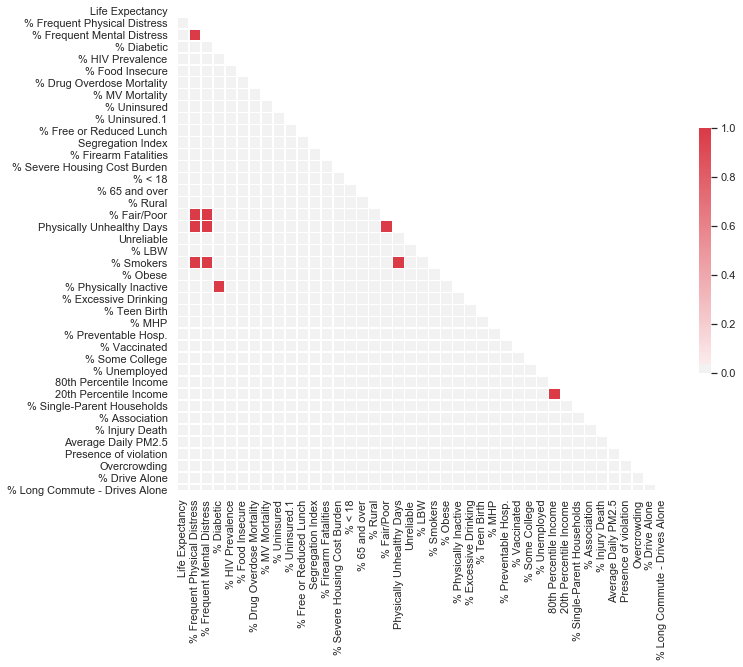

In [39]:
print_corr(sleep_df[x_cols], pct=0.75)

In [40]:
new_df=sleep_df[x_cols].drop(['% Fair/Poor','% Smokers','% Physically Inactive','Physically Unhealthy Days','20th Percentile Income','% Frequent Physical Distress'],axis=1)


In [41]:
new_df

,Life Expectancy,% Frequent Mental Distress,% Diabetic,% HIV Prevalence,% Food Insecure,% Drug Overdose Mortality,% MV Mortality,% Uninsured,% Uninsured.1,% Free or Reduced Lunch,...,% Unemployed,80th Percentile Income,% Single-Parent Households,% Association,% Injury Death,Average Daily PM2.5,Presence of violation,Overcrowding,% Drive Alone,% Long Commute - Drives Alone
0,76.330589,12.638357,14.2,0.002255,13.4,0.000096,0.000204,10.961104,2.476190,47.931664,...,3.863522,105294,24.700097,0.000126,0.000740,11.7,0,2.451581,85.965057,38.3
1,78.599498,12.822558,11.3,0.001639,12.3,0.000163,0.000151,13.570311,3.238027,45.079131,...,3.988336,105906,25.184091,0.000107,0.000694,10.3,1,1.072802,84.719423,40.5
2,75.779457,14.632311,18.0,0.004360,23.2,0.000189,0.000210,16.542240,2.901424,73.769808,...,5.900923,74459,57.215743,0.000085,0.000729,11.5,0,2.006508,83.404353,33.8
3,73.928271,12.854036,14.9,0.001919,15.8,0.000221,0.000253,12.297319,2.619447,65.329687,...,4.385140,88436,29.565404,0.000102,0.001001,11.2,0,0.199288,86.365902,48.6
4,74.597767,13.827943,14.3,0.000954,11.0,0.000248,0.000257,15.564604,3.430136,53.311793,...,4.021393,86549,29.569733,0.000090,0.001052,11.7,0,1.724718,86.792275,59.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,77.840131,10.693298,8.4,0.000865,11.1,0.000189,0.000173,15.270087,7.153332,35.276550,...,4.550299,119410,23.461861,0.000100,0.000854,5.1,1,2.997602,77.459237,18.6
3138,87.438200,9.868494,4.2,0.000505,9.9,0.000189,0.000089,16.043395,11.421708,23.774250,...,2.987005,160172,24.042601,0.000181,0.000619,4.9,1,3.543067,68.251837,14.6
3139,78.397790,11.956472,9.3,0.001223,14.1,0.000242,0.000096,15.073191,7.786820,37.183617,...,4.497702,109082,21.645737,0.000053,0.000980,5.9,1,2.720000,77.411790,17.8
3140,80.465989,11.490856,10.9,0.001223,12.0,0.000189,0.000188,19.590128,9.994926,40.735600,...,4.082625,87614,26.629611,0.000194,0.000700,4.8,0,2.421652,77.163005,10.6


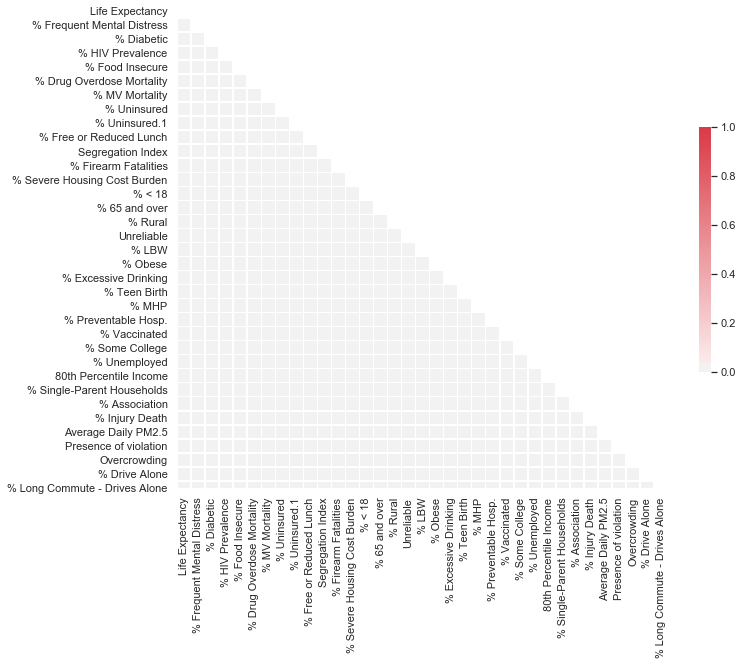

In [42]:
print_corr(new_df, pct=0.75)

### Investigate Multicollinearity

In [43]:
vif = [variance_inflation_factor(new_df.values, i) for i in range(new_df.shape[1])]
vif_scores =list(zip(new_df, vif))
vif_scores

[('Life Expectancy', 731.2748286592514),
 ('% Frequent Mental Distress', 208.57100534053131),
 ('% Diabetic', 110.54694010692755),
 ('% HIV Prevalence', 3.3797842298184353),
 ('% Food Insecure', 48.215684926990306),
 ('% Drug Overdose Mortality', 9.84909825764783),
 ('% MV Mortality', 13.312969652732491),
 ('% Uninsured', 33.44332973023886),
 ('% Uninsured.1', 19.581855549752355),
 ('% Free or Reduced Lunch', 32.11965718226274),
 ('Segregation Index', 8.678739853877236),
 ('% Firearm Fatalities', 13.261755083062678),
 ('% Severe Housing Cost Burden', 24.02045681070633),
 ('% < 18', 113.55235977515501),
 ('% 65 and over', 63.897878605514656),
 ('% Rural', 14.014966335490746),
 ('Unreliable', 23.73007143239754),
 ('% LBW', 40.0637404840245),
 ('% Obese', 127.3846476526105),
 ('% Excessive Drinking', 78.30972001168391),
 ('% Teen Birth', 19.799433659261062),
 ('% MHP', 2.879966086709212),
 ('% Preventable Hosp.', 11.142268248858366),
 ('% Vaccinated', 30.05627781151166),
 ('% Some College

In [44]:
X_new = [x for x,vif in vif_scores if vif < 100]
print(len(vif_scores), len(X_new))

35 29


In [45]:
vif = [variance_inflation_factor(sleep_df[X_new].values, i) for i in range(sleep_df[X_new].shape[1])]
vif_scores =list(zip(sleep_df[X_new], vif))
vif_scores

[('% HIV Prevalence', 3.030338038721394),
 ('% Food Insecure', 43.32344843465953),
 ('% Drug Overdose Mortality', 9.588191490882478),
 ('% MV Mortality', 13.016914688264706),
 ('% Uninsured', 31.095445493391583),
 ('% Uninsured.1', 18.50060207846669),
 ('% Free or Reduced Lunch', 30.71841043501338),
 ('Segregation Index', 8.496220603932796),
 ('% Firearm Fatalities', 13.217250740430556),
 ('% Severe Housing Cost Burden', 20.94736599832167),
 ('% 65 and over', 31.060683065719555),
 ('% Rural', 12.360595927324301),
 ('Unreliable', 23.04091874884917),
 ('% LBW', 38.08320224523556),
 ('% Excessive Drinking', 49.44130823711858),
 ('% Teen Birth', 16.990954983567434),
 ('% MHP', 2.7086221370700287),
 ('% Preventable Hosp.', 10.608180028061655),
 ('% Vaccinated', 27.629429036543574),
 ('% Some College', 61.05489303338054),
 ('% Unemployed', 17.024354882415444),
 ('80th Percentile Income', 63.12068658856171),
 ('% Single-Parent Households', 27.67247029690525),
 ('% Association', 7.936551748102

In [46]:
X5 = sm.add_constant(sleep_df[X_new])
model3 = sm.OLS(sleep_df[outcome], X5)
model3 = model3.fit()
print(model3.summary())

                             OLS Regression Results                             
Dep. Variable:     % Insufficient Sleep   R-squared:                       0.696
Model:                              OLS   Adj. R-squared:                  0.693
Method:                   Least Squares   F-statistic:                     245.6
Date:                  Wed, 15 Jan 2020   Prob (F-statistic):               0.00
Time:                          11:43:53   Log-Likelihood:                -7063.9
No. Observations:                  3142   AIC:                         1.419e+04
Df Residuals:                      3112   BIC:                         1.437e+04
Df Model:                            29                                         
Covariance Type:              nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

In [47]:
X_new = [x for x,vif in vif_scores if vif < 50]
print(len(vif_scores), len(X_new))

29 27


In [48]:
vif = [variance_inflation_factor(sleep_df[X_new].values, i) for i in range(sleep_df[X_new].shape[1])]
vif_scores =list(zip(sleep_df[X_new], vif))
vif_scores

[('% HIV Prevalence', 2.9597570521624785),
 ('% Food Insecure', 39.42323156925942),
 ('% Drug Overdose Mortality', 9.562274360452433),
 ('% MV Mortality', 12.963093937075755),
 ('% Uninsured', 31.053245997793898),
 ('% Uninsured.1', 17.54620475851871),
 ('% Free or Reduced Lunch', 28.82958729477902),
 ('Segregation Index', 8.482685939871475),
 ('% Firearm Fatalities', 13.184842901002757),
 ('% Severe Housing Cost Burden', 20.524795077185363),
 ('% 65 and over', 30.37646505084729),
 ('% Rural', 11.60247256060419),
 ('Unreliable', 22.97133819830997),
 ('% LBW', 36.23131733824702),
 ('% Excessive Drinking', 34.58416824416341),
 ('% Teen Birth', 16.405407297666525),
 ('% MHP', 2.585077577797125),
 ('% Preventable Hosp.', 10.60455798065105),
 ('% Vaccinated', 26.01272514266087),
 ('% Unemployed', 16.731918372782495),
 ('% Single-Parent Households', 27.03367300825654),
 ('% Association', 7.592501187878956),
 ('% Injury Death', 32.32021743626085),
 ('Average Daily PM2.5', 35.632601398315934),

In [49]:
X5 = sm.add_constant(sleep_df[X_new])
model3 = sm.OLS(sleep_df[outcome], X5)
model3 = model3.fit()
print(model3.summary())

                             OLS Regression Results                             
Dep. Variable:     % Insufficient Sleep   R-squared:                       0.675
Model:                              OLS   Adj. R-squared:                  0.672
Method:                   Least Squares   F-statistic:                     239.5
Date:                  Wed, 15 Jan 2020   Prob (F-statistic):               0.00
Time:                          11:43:54   Log-Likelihood:                -7168.8
No. Observations:                  3142   AIC:                         1.439e+04
Df Residuals:                      3114   BIC:                         1.456e+04
Df Model:                            27                                         
Covariance Type:              nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

### Check the Normality Assumption¶


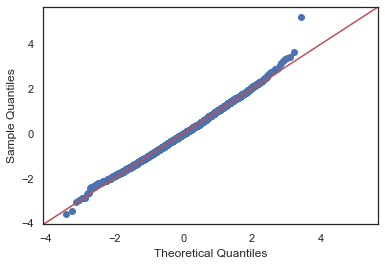

In [50]:
fig = sm.graphics.qqplot(model3.resid, dist=stats.norm, line='45', fit=True)


In [51]:
X_new

['% HIV Prevalence',
 '% Food Insecure',
 '% Drug Overdose Mortality',
 '% MV Mortality',
 '% Uninsured',
 '% Uninsured.1',
 '% Free or Reduced Lunch',
 'Segregation Index',
 '% Firearm Fatalities',
 '% Severe Housing Cost Burden',
 '% 65 and over',
 '% Rural',
 'Unreliable',
 '% LBW',
 '% Excessive Drinking',
 '% Teen Birth',
 '% MHP',
 '% Preventable Hosp.',
 '% Vaccinated',
 '% Unemployed',
 '% Single-Parent Households',
 '% Association',
 '% Injury Death',
 'Average Daily PM2.5',
 'Presence of violation',
 'Overcrowding',
 '% Long Commute - Drives Alone']

### Check Homoscedasticity Assumption¶

In [52]:
sleep_new=sleep_df[X_new]

In [53]:
sleep_new.insert(0,'const',1)

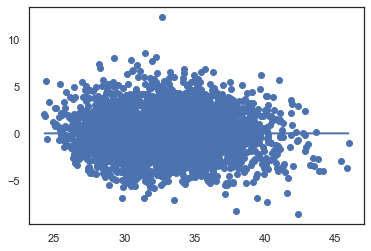

In [54]:
plt.scatter(model3.predict(sleep_new), model3.resid)
plt.plot(model3.predict(sleep_new), [0 for i in range(len(sleep_df))])

### Make Additional Refinements

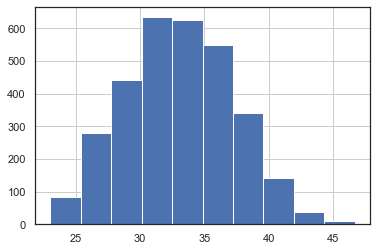

In [55]:
sleep_df[outcome].hist()

In [56]:
for i in range(80,100):
    q = i/100
    print("{} percentile: {}".format(q, sleep_df[outcome].quantile(q=q)))

0.8 percentile: 36.7250723056
0.81 percentile: 36.8658302474
0.82 percentile: 37.04192521612
0.83 percentile: 37.2159003705
0.84 percentile: 37.353928353200004
0.85 percentile: 37.4898511652
0.86 percentile: 37.64552704674
0.87 percentile: 37.84134101752
0.88 percentile: 38.027142627239996
0.89 percentile: 38.19995776732
0.9 percentile: 38.3913701222
0.91 percentile: 38.61555559251
0.92 percentile: 38.92068907408
0.93 percentile: 39.23992026156001
0.94 percentile: 39.600080393599995
0.95 percentile: 39.95218871744999
0.96 percentile: 40.250282864599995
0.97 percentile: 40.84266697976
0.98 percentile: 41.481555799359995
0.99 percentile: 42.36278792201001


In [57]:
orig_tot=len(sleep_df)
sleep_df = sleep_df[sleep_df[outcome] < 42] # Subsetting to remove extreme outliers
print('Percent removed:', (orig_tot -len(sleep_df))/orig_tot)
train, test = train_test_split(sleep_df)

Percent removed: 0.01464035646085296


In [58]:
X5 = sm.add_constant(sleep_df[X_new])
model3 = sm.OLS(sleep_df[outcome], X5)
model3 = model3.fit()
print(model3.summary())

                             OLS Regression Results                             
Dep. Variable:     % Insufficient Sleep   R-squared:                       0.658
Model:                              OLS   Adj. R-squared:                  0.655
Method:                   Least Squares   F-statistic:                     218.3
Date:                  Wed, 15 Jan 2020   Prob (F-statistic):               0.00
Time:                          11:43:58   Log-Likelihood:                -7019.2
No. Observations:                  3096   AIC:                         1.409e+04
Df Residuals:                      3068   BIC:                         1.426e+04
Df Model:                            27                                         
Covariance Type:              nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------

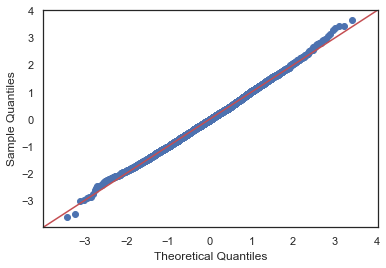

In [59]:
fig = sm.graphics.qqplot(model3.resid, dist=stats.norm, line='45', fit=True)


In [60]:
sleep_new=sleep_df[X_new]
sleep_new.insert(0,'const',1)

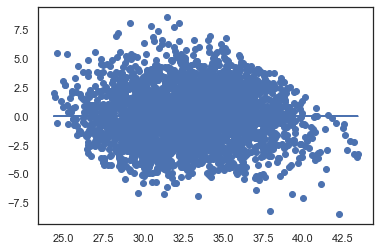

In [61]:
plt.scatter(model3.predict(sleep_new), model3.resid)
plt.plot(model3.predict(sleep_new), [0 for i in range(len(sleep_df))])

### Create X and y

In [62]:
y = sleep_df['% Insufficient Sleep']
X = sleep_df[X_new]

In [63]:
X

,% HIV Prevalence,% Food Insecure,% Drug Overdose Mortality,% MV Mortality,% Uninsured,% Uninsured.1,% Free or Reduced Lunch,Segregation Index,% Firearm Fatalities,% Severe Housing Cost Burden,...,% Preventable Hosp.,% Vaccinated,% Unemployed,% Single-Parent Households,% Association,% Injury Death,Average Daily PM2.5,Presence of violation,Overcrowding,% Long Commute - Drives Alone
0,0.002255,13.4,0.000096,0.000204,10.961104,2.476190,47.931664,27.147569,0.000177,12.645206,...,0.06599,41.0,3.863522,24.700097,0.000126,0.000740,11.7,0,2.451581,38.3
1,0.001639,12.3,0.000163,0.000151,13.570311,3.238027,45.079131,33.240059,0.000144,12.795922,...,0.03833,45.0,3.988336,25.184091,0.000107,0.000694,10.3,1,1.072802,40.5
2,0.004360,23.2,0.000189,0.000210,16.542240,2.901424,73.769808,24.313765,0.000152,13.586765,...,0.04736,37.0,5.900923,57.215743,0.000085,0.000729,11.5,0,2.006508,33.8
3,0.001919,15.8,0.000221,0.000253,12.297319,2.619447,65.329687,38.499424,0.000213,8.733889,...,0.05998,39.0,4.385140,29.565404,0.000102,0.001001,11.2,0,0.199288,48.6
4,0.000954,11.0,0.000248,0.000257,15.564604,3.430136,53.311793,21.205761,0.000197,8.194495,...,0.04162,38.0,4.021393,29.569733,0.000090,0.001052,11.7,0,1.724718,59.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,0.000865,11.1,0.000189,0.000173,15.270087,7.153332,35.276550,36.378235,0.000171,9.284945,...,0.03289,37.0,4.550299,23.461861,0.000100,0.000854,5.1,1,2.997602,18.6
3138,0.000505,9.9,0.000189,0.000089,16.043395,11.421708,23.774250,39.745432,0.000144,10.591792,...,0.02341,47.0,2.987005,24.042601,0.000181,0.000619,4.9,1,3.543067,14.6
3139,0.001223,14.1,0.000242,0.000096,15.073191,7.786820,37.183617,13.865107,0.000202,8.404941,...,0.03140,33.0,4.497702,21.645737,0.000053,0.000980,5.9,1,2.720000,17.8
3140,0.001223,12.0,0.000189,0.000188,19.590128,9.994926,40.735600,13.590562,0.000144,8.936686,...,0.04330,43.0,4.082625,26.629611,0.000194,0.000700,4.8,0,2.421652,10.6


In [64]:
y

0       35.905406
1       33.305868
2       38.563167
3       38.148865
4       35.945010
          ...    
3137    31.170904
3138    26.551742
3139    31.090485
3140    28.472484
3141    30.225940
Name: % Insufficient Sleep, Length: 3096, dtype: float64

### Train Test Split

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

In [66]:
X_test = X_test.reset_index(drop=True)
X_test

,% HIV Prevalence,% Food Insecure,% Drug Overdose Mortality,% MV Mortality,% Uninsured,% Uninsured.1,% Free or Reduced Lunch,Segregation Index,% Firearm Fatalities,% Severe Housing Cost Burden,...,% Preventable Hosp.,% Vaccinated,% Unemployed,% Single-Parent Households,% Association,% Injury Death,Average Daily PM2.5,Presence of violation,Overcrowding,% Long Commute - Drives Alone
0,0.001223,9.5,0.000189,0.000173,11.287478,6.707317,31.843575,30.377868,0.000144,5.936540,...,0.05663,27.0,3.424056,29.102845,0.000304,0.001295,5.4,0,0.379147,15.4
1,0.001223,11.2,0.000189,0.000133,6.531138,2.937916,51.676901,13.151903,0.000144,12.859325,...,0.05364,46.0,5.873839,37.012802,0.000116,0.000636,8.0,0,2.147040,41.2
2,0.000649,14.7,0.000265,0.000197,9.799441,5.112474,59.818339,23.031691,0.000391,14.378045,...,0.02414,32.0,6.089071,37.421100,0.000128,0.001555,8.0,1,2.104256,14.1
3,0.004682,14.3,0.000189,0.000140,15.091845,5.441119,66.818400,23.730110,0.000174,12.638581,...,0.05780,38.0,4.565691,45.589130,0.000129,0.000641,10.3,1,2.253986,37.4
4,0.000553,12.8,0.000552,0.000167,6.535067,4.696320,66.195524,43.841045,0.000143,9.400857,...,0.05060,39.0,6.148243,31.605169,0.000203,0.001107,11.9,1,0.701139,44.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
769,0.001652,12.7,0.000189,0.000165,21.363229,7.494519,58.588621,36.769709,0.000157,9.772625,...,0.06873,40.0,4.536199,40.423764,0.000125,0.000775,10.1,0,2.177068,31.8
770,0.001824,12.8,0.000654,0.000086,6.182630,2.552922,51.918590,43.746466,0.000106,10.462596,...,0.05087,52.0,4.002325,36.496444,0.000073,0.000989,12.2,0,1.607071,28.6
771,0.003642,6.5,0.000141,0.000167,10.232613,6.078360,20.183232,21.577781,0.000113,10.451090,...,0.04070,49.0,3.348247,19.519752,0.000127,0.000670,9.0,0,1.027749,59.5
772,0.001070,19.0,0.000194,0.000166,14.394122,6.214331,42.149400,35.855640,0.000202,10.714127,...,0.02953,32.0,6.106223,35.639755,0.000093,0.000935,6.7,1,2.851711,16.8


In [67]:
X_train = X_train.reset_index(drop=True)
X_train

,% HIV Prevalence,% Food Insecure,% Drug Overdose Mortality,% MV Mortality,% Uninsured,% Uninsured.1,% Free or Reduced Lunch,Segregation Index,% Firearm Fatalities,% Severe Housing Cost Burden,...,% Preventable Hosp.,% Vaccinated,% Unemployed,% Single-Parent Households,% Association,% Injury Death,Average Daily PM2.5,Presence of violation,Overcrowding,% Long Commute - Drives Alone
0,0.000369,11.6,0.000109,0.000131,10.042777,6.143874,42.263570,29.502019,0.000099,6.725697,...,0.05829,47.0,2.926478,37.577729,0.000157,0.000573,12.4,0,1.261927,26.2
1,0.001301,16.6,0.000163,0.000195,21.338459,13.230397,65.072016,46.357014,0.000120,11.783668,...,0.03860,46.0,3.726409,30.407953,0.000152,0.000977,8.8,1,2.068169,29.3
2,0.000410,10.5,0.000162,0.000118,7.772021,3.961652,40.678937,33.894720,0.000125,12.091091,...,0.05384,44.0,5.370433,27.152737,0.000094,0.000618,10.3,0,1.698286,54.1
3,0.005562,16.6,0.000189,0.000330,23.126301,7.483233,99.518459,24.923346,0.000222,15.298805,...,0.05963,43.0,4.369031,43.046121,0.000159,0.001019,10.4,0,3.768844,35.0
4,0.001474,10.6,0.000212,0.000226,27.163734,11.470299,66.514970,33.906428,0.000190,11.825216,...,0.04004,43.0,5.013347,31.980033,0.000087,0.000917,9.9,0,2.539827,41.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2317,0.000424,13.4,0.000181,0.000158,8.232865,5.092039,46.355685,33.184433,0.000041,9.714948,...,0.04466,43.0,4.904043,24.586308,0.000186,0.000604,11.3,0,1.958384,32.5
2318,0.004121,19.3,0.000283,0.000093,10.860458,4.441541,100.000000,39.825411,0.000085,23.807157,...,0.04880,45.0,6.814328,54.512979,0.000112,0.000802,9.0,1,1.299940,34.8
2319,0.001223,10.1,0.000189,0.000173,6.842576,4.404404,41.994751,30.377868,0.000144,6.550481,...,0.09283,31.0,6.563193,22.944162,0.000250,0.000644,6.2,0,1.084337,27.6
2320,0.001566,17.6,0.000189,0.000292,17.050428,6.165971,93.595041,13.847188,0.000144,11.491935,...,0.05687,39.0,5.721717,43.379212,0.000132,0.000805,11.3,0,2.835596,39.2


In [68]:
y_train = y_train.reset_index(drop=True)
y_train

0       35.504853
1       28.539648
2       35.880807
3       37.373638
4       32.856692
          ...    
2317    36.217391
2318    37.080551
2319    28.188834
2320    37.700905
2321    28.349878
Name: % Insufficient Sleep, Length: 2322, dtype: float64

In [69]:
y_test = y_test.reset_index(drop=True)
y_test

0      23.529242
1      35.131392
2      29.590476
3      38.017021
4      36.079386
         ...    
769    35.257575
770    34.860441
771    34.931493
772    34.171177
773    32.884927
Name: % Insufficient Sleep, Length: 774, dtype: float64

### Baseline

In [70]:
regression = LinearRegression()
crossvalidation = KFold(n_splits=5, shuffle=True, random_state=1)
baseline = np.mean(cross_val_score(regression, X_train, y_train, scoring='r2', cv=crossvalidation))
baseline

0.6565838357240702

### Interaction

In [71]:
display_all(X_train.head().T)

,0,1,2,3,4
% HIV Prevalence,0.000369,0.001301,0.000410,0.005562,0.001474
% Food Insecure,11.600000,16.600000,10.500000,16.600000,10.600000
% Drug Overdose Mortality,0.000109,0.000163,0.000162,0.000189,0.000212
% MV Mortality,0.000131,0.000195,0.000118,0.000330,0.000226
% Uninsured,10.042777,21.338459,7.772021,23.126301,27.163734
% Uninsured.1,6.143874,13.230397,3.961652,7.483233,11.470299
% Free or Reduced Lunch,42.263570,65.072016,40.678937,99.518459,66.514970
Segregation Index,29.502019,46.357014,33.894720,24.923346,33.906428
% Firearm Fatalities,0.000099,0.000120,0.000125,0.000222,0.000190
% Severe Housing Cost Burden,6.725697,11.783668,12.091091,15.298805,11.825216


In [72]:
combinations = list(combinations(X_train.columns, 2))

interactions = []
data = X_train.copy()
for comb in combinations:
    data['interaction'] = data[comb[0]] * data[comb[1]]
    score = np.mean(cross_val_score(regression, data, y_train, scoring='r2', cv=crossvalidation))
    if score > baseline: interactions.append((comb[0], comb[1], round(score, 3)))
            
print('Top 7 interactions: %s' %sorted(interactions, key=lambda inter: inter[2], reverse=True)[:7])

Top 7 interactions: [('% Excessive Drinking', 'Average Daily PM2.5', 0.663), ('% Uninsured.1', '% LBW', 0.662), ('% Uninsured', '% Single-Parent Households', 0.661), ('% Uninsured.1', '% Excessive Drinking', 0.661), ('% Free or Reduced Lunch', '% Single-Parent Households', 0.661), ('% Teen Birth', '% Single-Parent Households', 0.661), ('% Uninsured', '% Excessive Drinking', 0.66)]


In [73]:
ls_interactions = sorted(interactions, key=lambda inter: inter[2], reverse=True)[:3]
for inter in ls_interactions:
#     inter_name = inter[0] + '_' + X_train[1]
    X_train[inter[0] + '_' + inter[1]] = X_train[inter[0]] * X_train[inter[1]]
    X_test[inter[0] + '_' + inter[1]] = X_test[inter[0]] * X_test[inter[1]]
# ls_interactions

### Polynomial

In [74]:
polynomials = []
for col in X_train.columns:
    for degree in [2, 3, 4]:
        data = X_train.copy()
        poly = PolynomialFeatures(degree, include_bias=False)
        X_transformed = poly.fit_transform(X_train[[col]])
        data = pd.concat([data.drop(col, axis=1),pd.DataFrame(X_transformed)], axis=1)
        score = np.mean(cross_val_score(regression, data, y_train, scoring='r2', cv=crossvalidation))
        if score > baseline: polynomials.append((col, degree, round(score, 5)))
print('Top 10 polynomials: %s' %sorted(polynomials, key=lambda poly: poly[2], reverse=True)[:10])

Top 10 polynomials: [('Presence of violation', 2, 0.67676), ('Presence of violation', 3, 0.67676), ('Presence of violation', 4, 0.67676), ('Average Daily PM2.5', 2, 0.67668), ('Average Daily PM2.5', 3, 0.67606), ('Average Daily PM2.5', 4, 0.67533), ('% Uninsured.1_% LBW', 4, 0.67507), ('% Uninsured', 4, 0.67496), ('% Unemployed', 3, 0.67477), ('% Preventable Hosp.', 4, 0.67416)]


In [75]:
polynom = pd.DataFrame(polynomials)
polynom.groupby([0], sort=False)[2].max()

0
% HIV Prevalence                            0.67221
% Food Insecure                             0.67113
% Drug Overdose Mortality                   0.67078
% MV Mortality                              0.67076
% Uninsured                                 0.67496
% Uninsured.1                               0.67132
% Free or Reduced Lunch                     0.67302
Segregation Index                           0.67036
% Firearm Fatalities                        0.67142
% Severe Housing Cost Burden                0.66985
% 65 and over                               0.66997
% Rural                                     0.67298
Unreliable                                  0.67072
% LBW                                       0.67350
% Excessive Drinking                        0.67232
% Teen Birth                                0.67019
% MHP                                       0.67034
% Preventable Hosp.                         0.67416
% Vaccinated                                0.67185
% Unemploy

In [76]:
X_ = X_train.copy()
X_t = X_test.copy()
for col in ['Average Daily PM2.5', 'Presence of violation']:
    #Instantiate PolynomialFeatures
    poly = PolynomialFeatures(3, include_bias=False)
    #Fit and transform X_train
    X_poly_train = poly.fit_transform(np.array(X_[col]).reshape(-1, 1))
    X_poly_test = poly.transform(np.array(X_t[col]).reshape(-1, 1))
    #Add polynomial columns to train and test data sets
    colnames= [col, col + '_^2',  col + '_^3']
    X_train = pd.concat([X_train.drop(col, axis=1),pd.DataFrame(X_poly_train, columns=colnames)], axis=1)
    X_test = pd.concat([X_test.drop(col, axis=1),pd.DataFrame(X_poly_test, columns=colnames)], axis=1)

In [77]:
X_train

,% HIV Prevalence,% Food Insecure,% Drug Overdose Mortality,% MV Mortality,% Uninsured,% Uninsured.1,% Free or Reduced Lunch,Segregation Index,% Firearm Fatalities,% Severe Housing Cost Burden,...,% Long Commute - Drives Alone,% Excessive Drinking_Average Daily PM2.5,% Uninsured.1_% LBW,% Uninsured_% Single-Parent Households,Average Daily PM2.5,Average Daily PM2.5_^2,Average Daily PM2.5_^3,Presence of violation,Presence of violation_^2,Presence of violation_^3
0,0.000369,11.6,0.000109,0.000131,10.042777,6.143874,42.263570,29.502019,0.000099,6.725697,...,26.2,229.613219,41.970500,377.384750,12.4,153.76,1906.624,0.0,0.0,0.0
1,0.001301,16.6,0.000163,0.000195,21.338459,13.230397,65.072016,46.357014,0.000120,11.783668,...,29.3,136.893177,95.923300,648.858851,8.8,77.44,681.472,1.0,1.0,1.0
2,0.000410,10.5,0.000162,0.000118,7.772021,3.961652,40.678937,33.894720,0.000125,12.091091,...,54.1,226.224278,27.051392,211.031638,10.3,106.09,1092.727,0.0,0.0,0.0
3,0.005562,16.6,0.000189,0.000330,23.126301,7.483233,99.518459,24.923346,0.000222,15.298805,...,35.0,143.066384,77.083443,995.497555,10.4,108.16,1124.864,0.0,0.0,0.0
4,0.001474,10.6,0.000212,0.000226,27.163734,11.470299,66.514970,33.906428,0.000190,11.825216,...,41.8,146.498651,84.904312,868.697116,9.9,98.01,970.299,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2317,0.000424,13.4,0.000181,0.000158,8.232865,5.092039,46.355685,33.184433,0.000041,9.714948,...,32.5,193.041887,31.602483,202.415753,11.3,127.69,1442.897,0.0,0.0,0.0
2318,0.004121,19.3,0.000283,0.000093,10.860458,4.441541,100.000000,39.825411,0.000085,23.807157,...,34.8,127.782497,39.386787,592.035901,9.0,81.00,729.000,1.0,1.0,1.0
2319,0.001223,10.1,0.000189,0.000173,6.842576,4.404404,41.994751,30.377868,0.000144,6.550481,...,27.6,142.296018,34.310021,156.997176,6.2,38.44,238.328,0.0,0.0,0.0
2320,0.001566,17.6,0.000189,0.000292,17.050428,6.165971,93.595041,13.847188,0.000144,11.491935,...,39.2,152.089180,69.357649,739.634141,11.3,127.69,1442.897,0.0,0.0,0.0


In [78]:
X_test

,% HIV Prevalence,% Food Insecure,% Drug Overdose Mortality,% MV Mortality,% Uninsured,% Uninsured.1,% Free or Reduced Lunch,Segregation Index,% Firearm Fatalities,% Severe Housing Cost Burden,...,% Long Commute - Drives Alone,% Excessive Drinking_Average Daily PM2.5,% Uninsured.1_% LBW,% Uninsured_% Single-Parent Households,Average Daily PM2.5,Average Daily PM2.5_^2,Average Daily PM2.5_^3,Presence of violation,Presence of violation_^2,Presence of violation_^3
0,0.001223,9.5,0.000189,0.000173,11.287478,6.707317,31.843575,30.377868,0.000144,5.936540,...,15.4,93.993750,52.249560,328.497717,5.4,29.16,157.464,0.0,0.0,0.0
1,0.001223,11.2,0.000189,0.000133,6.531138,2.937916,51.676901,13.151903,0.000144,12.859325,...,41.2,156.836941,20.191861,241.735715,8.0,64.00,512.000,0.0,0.0,0.0
2,0.000649,14.7,0.000265,0.000197,9.799441,5.112474,59.818339,23.031691,0.000391,14.378045,...,14.1,127.349969,32.641497,366.705881,8.0,64.00,512.000,1.0,1.0,1.0
3,0.004682,14.3,0.000189,0.000140,15.091845,5.441119,66.818400,23.730110,0.000174,12.638581,...,37.4,178.974841,47.439085,688.024095,10.3,106.09,1092.727,1.0,1.0,1.0
4,0.000553,12.8,0.000552,0.000167,6.535067,4.696320,66.195524,43.841045,0.000143,9.400857,...,44.3,221.671357,33.042038,206.541881,11.9,141.61,1685.159,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
769,0.001652,12.7,0.000189,0.000165,21.363229,7.494519,58.588621,36.769709,0.000157,9.772625,...,31.8,161.412931,58.261276,863.582116,10.1,102.01,1030.301,0.0,0.0,0.0
770,0.001824,12.8,0.000654,0.000086,6.182630,2.552922,51.918590,43.746466,0.000106,10.462596,...,28.6,216.903488,22.170153,225.644008,12.2,148.84,1815.848,0.0,0.0,0.0
771,0.003642,6.5,0.000141,0.000167,10.232613,6.078360,20.183232,21.577781,0.000113,10.451090,...,59.5,176.155355,37.849218,199.738065,9.0,81.00,729.000,0.0,0.0,0.0
772,0.001070,19.0,0.000194,0.000166,14.394122,6.214331,42.149400,35.855640,0.000202,10.714127,...,16.8,114.447115,50.695125,513.002986,6.7,44.89,300.763,1.0,1.0,1.0


### Full model

In [79]:
cols=X_train.columns

In [80]:
scale=StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)

In [81]:
linreg = LinearRegression()
cdf = pd.DataFrame()
cv_results = cross_validate(linreg, X_train, y_train, cv=5, return_estimator=True)
for model in cv_results['estimator']:
    cdf1 = pd.DataFrame(model.coef_, cols, columns=['Coefficients'])
    cdf = pd.concat([cdf,cdf1],axis=1)

In [82]:
cdf['mean_coef'] = cdf.mean(axis=1)

In [122]:
cdf = cdf.sort_values('mean_coef')
cdf

,Coefficients,Coefficients,Coefficients,Coefficients,Coefficients,mean_coef
% Excessive Drinking_Average Daily PM2.5,-2.076062,-2.771173,-2.352219,-2.386636,-2.476933,-2.412605
Average Daily PM2.5_^2,-1.233110,-1.321912,-0.507692,-1.790757,-1.244748,-1.219644
% Uninsured.1_% LBW,-1.177778,-1.353400,-1.076785,-1.138625,-0.941966,-1.137711
% Uninsured_% Single-Parent Households,-0.912668,-1.010563,-1.171336,-1.293950,-1.149740,-1.107651
% 65 and over,-0.842175,-0.709245,-0.709327,-0.746687,-0.795962,-0.760679
% Association,-0.489989,-0.539042,-0.507162,-0.442515,-0.480650,-0.491872
Presence of violation,-0.344231,-0.374020,-0.368360,-0.370244,-0.399663,-0.371304
Presence of violation_^3,-0.344231,-0.374020,-0.368360,-0.370244,-0.399663,-0.371304
Average Daily PM2.5_^3,-0.323479,-0.154594,-0.687765,-0.054162,-0.306734,-0.305347
Overcrowding,-0.225559,-0.303949,-0.254443,-0.243105,-0.242042,-0.253820


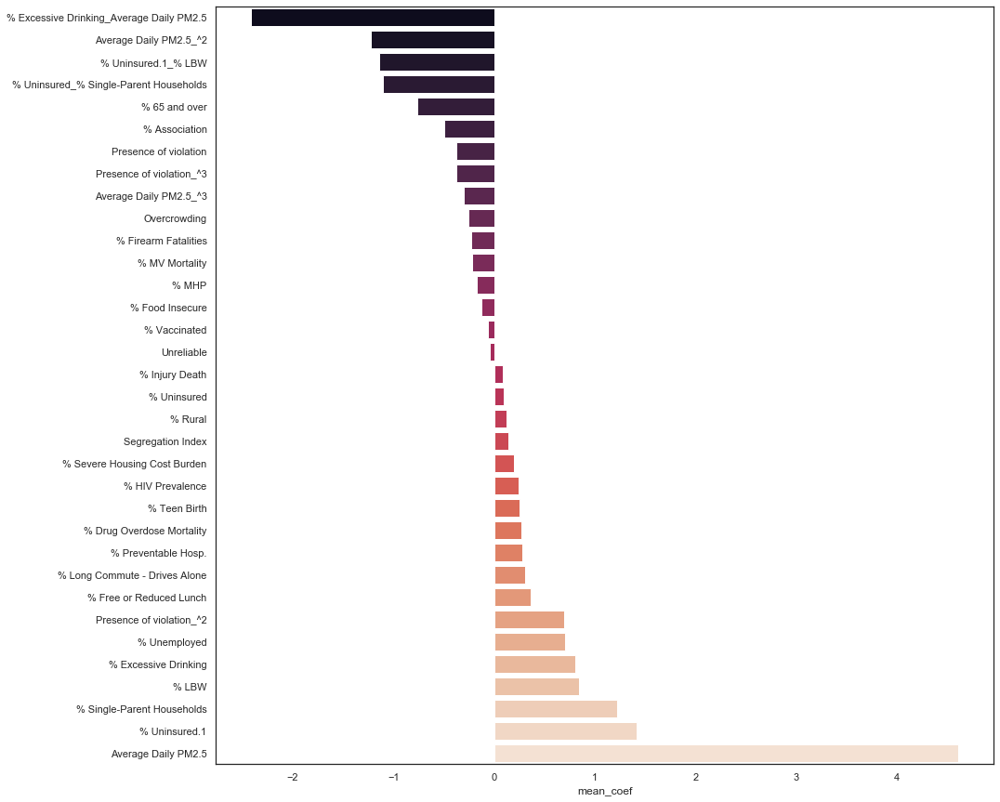

In [126]:
sns.set(rc={'figure.figsize':(15,15)})
sns.set_style("white")
sns.barplot(x=cdf['mean_coef'], y=cdf.index, palette="rocket")

In [85]:
linreg.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [86]:
scores = cross_val_score(linreg,X_train,y_train,cv=5)

In [87]:
np.mean(scores)

0.6805025881178375

### AIC BIC

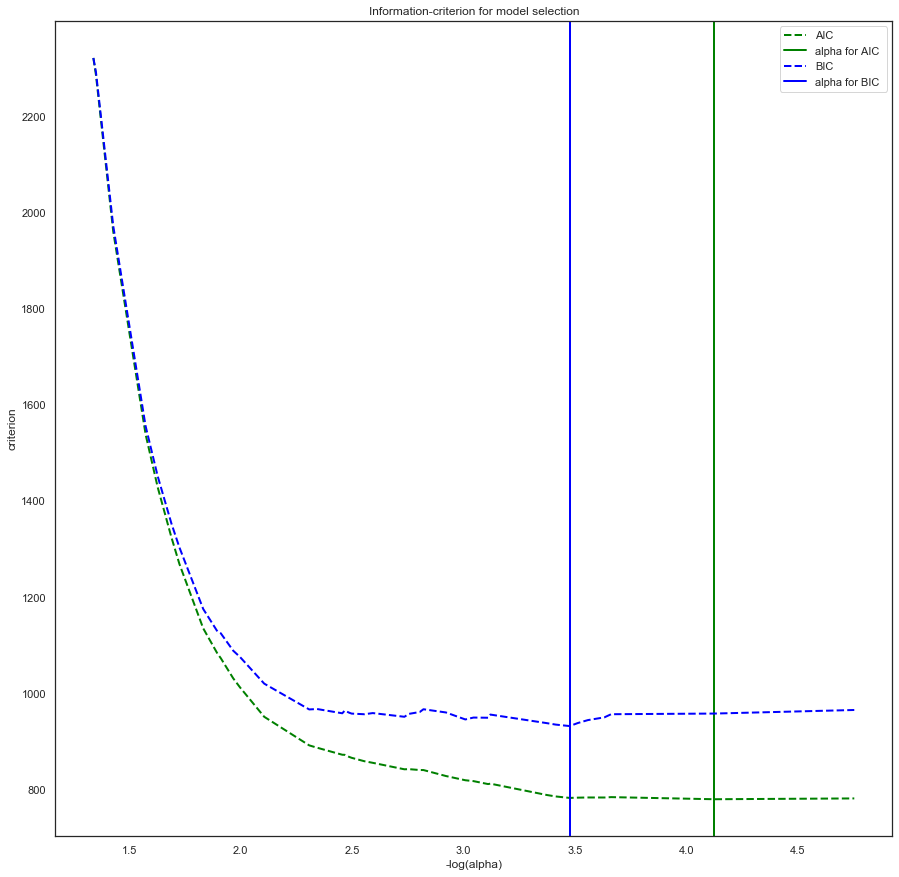

In [88]:
model_bic = LassoLarsIC(criterion='bic')
model_bic.fit(X_train, y_train)
alpha_bic_ = model_bic.alpha_

model_aic = LassoLarsIC(criterion='aic')
model_aic.fit(X_train, y_train)
alpha_aic_ = model_aic.alpha_


def plot_ic_criterion(model, name, color):
    alpha_ = model.alpha_
    alphas_ = model.alphas_
    criterion_ = model.criterion_
    plt.plot(-np.log10(alphas_), criterion_, '--', color=color, linewidth=2, label= name)
    plt.axvline(-np.log10(alpha_), color=color, linewidth=2,
                label='alpha for %s ' % name)
    plt.xlabel('-log(alpha)')
    plt.ylabel('criterion')

plt.figure()
plot_ic_criterion(model_aic, 'AIC', 'green')
plot_ic_criterion(model_bic, 'BIC', 'blue')
plt.legend()
plt.title('Information-criterion for model selection');

### Ridge

In [90]:
ridge = Ridge(alpha= model_aic.alpha_) 
ridge.fit(X_train, y_train)

# ridge.coef = pd.concat([pd.DataFrame(ridge.coef),X_train.columns],axis=1)

# # Print R2 and MSE
print('Training r^2:', ridge.score(X_train, y_train))
print('Test r^2:', ridge.score(X_test, y_test))
print('Training MSE:', mean_squared_error(y_train, ridge.predict(X_train)))
print('Test MSE:', mean_squared_error(y_test, ridge.predict(X_test)))

Training r^2: 0.6912861722174037
Test r^2: 0.6539092989175341
Training MSE: 4.907834999749064
Test MSE: 5.547971636430707


In [92]:
ridge = Ridge(alpha= model_bic.alpha_) 
ridge.fit(X_train, y_train)

# Print R2 and MSE
print('Training r^2:', ridge.score(X_train, y_train))
print('Test r^2:', ridge.score(X_test, y_test))
print('Training MSE:', mean_squared_error(y_train, ridge.predict(X_train)))
print('Test MSE:', mean_squared_error(y_test, ridge.predict(X_test)))

Training r^2: 0.6912861721876731
Test r^2: 0.6539093749023144
Training MSE: 4.907835000221714
Test MSE: 5.547970418364447


### Lasso

In [93]:
lasso = Lasso(alpha= model_aic.alpha_) 
lasso.fit(X_train, y_train)

# Print R2 and MSE
print(lasso.coef_)
print('Training r^2:', lasso.score(X_train, y_train))
print('Test r^2:', lasso.score(X_test, y_test))
print('Training MSE:', mean_squared_error(y_train, lasso.predict(X_train)))
print('Test MSE:', mean_squared_error(y_test, lasso.predict(X_test)))

[ 0.2432957  -0.12274407  0.27114035 -0.21919164  0.09960208  1.40385579
  0.36162667  0.14290748 -0.22364896  0.19267955 -0.75904931  0.12856678
 -0.04048023  0.83577826  0.78400219  0.25158224 -0.17513603  0.27916092
 -0.05601417  0.70249098  1.22099547 -0.49071899  0.08280203 -0.24821101
  0.3040039  -2.38852024 -1.13065842 -1.11231562  4.44007615 -0.97102544
 -0.41172082 -0.11930004  0.69948924 -0.62629334]
Training r^2: 0.6912788160060165
Test r^2: 0.6539567798915318
Training MSE: 4.907951946475976
Test MSE: 5.547210497526412


In [94]:
lasso = Lasso(alpha= model_bic.alpha_) 
lasso.fit(X_train, y_train)

# Print R2 and MSE
print('Training r^2:', lasso.score(X_train, y_train))
print('Test r^2:', lasso.score(X_test, y_test))
print('Training Test difference:',lasso.score(X_train, y_train)-lasso.score(X_test, y_test))
print('Training MSE:', mean_squared_error(y_train, lasso.predict(X_train)))
print('Test MSE:', mean_squared_error(y_test, lasso.predict(X_test)))

Training r^2: 0.6912633134518966
Test r^2: 0.653965855380521
Training Test difference: 0.03729745807137563
Training MSE: 4.908198401188556
Test MSE: 5.547065013827075


### LassoCV

In [97]:
lassocv = LassoCV(cv=10, random_state=0).fit(X_train, y_train) 

# Print R2 and MSE
print('Training r^2:', lassocv.score(X_train, y_train))
print('Test r^2:', lassocv.score(X_test, y_test))
print('Training Test difference:',lassocv.score(X_train, y_train)-lassocv.score(X_test, y_test))
print('Training MSE:', mean_squared_error(y_train, lassocv.predict(X_train)))
print('Test MSE:', mean_squared_error(y_test, lassocv.predict(X_test)))

Training r^2: 0.690975804561283
Test r^2: 0.6536356228237846
Training Test difference: 0.037340181737498424
Training MSE: 4.912769126789761
Test MSE: 5.552358773100207


In [98]:
cdf2 = pd.DataFrame(lassocv.coef_, cols, columns=['Coefficients'])

In [124]:
cdf2 = cdf2.sort_values('Coefficients')
cdf2

,Coefficients
% Excessive Drinking_Average Daily PM2.5,-2.049235
% Uninsured.1_% LBW,-1.021983
% Uninsured_% Single-Parent Households,-1.013416
Average Daily PM2.5_^3,-0.845997
% 65 and over,-0.754852
Presence of violation_^3,-0.607918
% Association,-0.481409
Overcrowding,-0.244403
% Firearm Fatalities,-0.210736
% MV Mortality,-0.204108


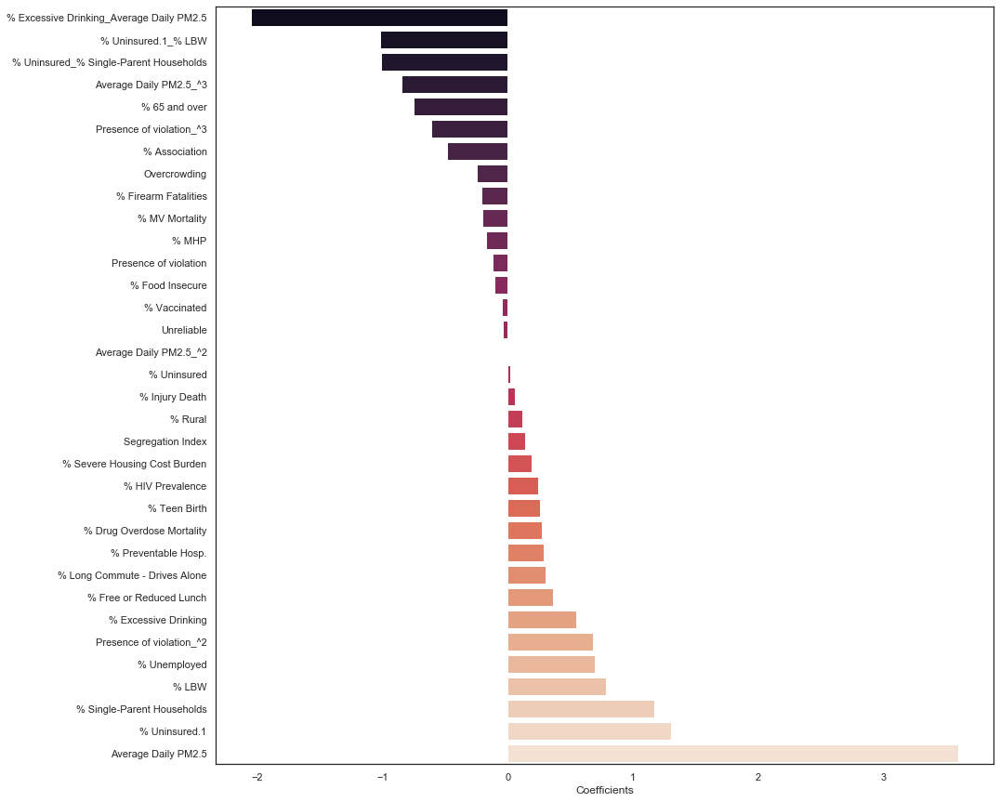

In [125]:
sns.set(rc={'figure.figsize':(15,15)})
sns.set_style("white")
sns.barplot(x=cdf2['Coefficients'], y=cdf2.index, palette="rocket")

### ElasticNet

In [104]:
enet = ElasticNet(alpha=model_aic.alpha_, l1_ratio=0.7)
enet.fit(X_train, y_train)

# Print R2 and MSE
print('Training r^2:', enet.score(X_train, y_train))
print('Test r^2:', enet.score(X_test, y_test))
print('Training Test difference:',enet.score(X_train, y_train)-enet.score(X_test, y_test))
print('Training MSE:', mean_squared_error(y_train, enet.predict(X_train)))
print('Test MSE:', mean_squared_error(y_test, enet.predict(X_test)))

Training r^2: 0.6912773643184927
Test r^2: 0.6539593995142474
Training Test difference: 0.03731796480424532
Training MSE: 4.907975024946056
Test MSE: 5.547168503932019


### ElasticNetCV

In [103]:
from sklearn.linear_model import ElasticNetCV
enetcv = ElasticNetCV(cv=5, random_state=0)
enetcv.fit(X_train, y_train)

# Print R2 and MSE
print('Training r^2:', enetcv.score(X_train, y_train))
print('Test r^2:', enetcv.score(X_test, y_test))
print('Training Test difference:',enetcv.score(X_train, y_train)-enetcv.score(X_test, y_test))
print('Training MSE:', mean_squared_error(y_train, enetcv.predict(X_train)))
print('Test MSE:', mean_squared_error(y_test, enetcv.predict(X_test)))

Training r^2: 0.6899991145225659
Test r^2: 0.6526671178535816
Training Test difference: 0.037331996668984346
Training MSE: 4.928296236768449
Test MSE: 5.567884293108756
